# Import Python packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

import torch
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import nn
from torch.nn import  functional as F

In [2]:
from sklearn.neural_network import MLPRegressor

# Make dataset

In [3]:
pd_train = pd.read_excel("D:/database/data_all_strain-controlled.xls",nrows=100000)#Change this path to your own path 
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Unnamed: 5,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,NaN,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,NaN,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,NaN,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,NaN,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,NaN,3.409764


In [4]:
pd_train.drop(columns=['Unnamed: 5'],inplace=True)
pd_train

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304000,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304000,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304000,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304000,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304000,3.409764
...,...,...,...,...,...,...
909,AZ31B-4-0.004-0.0069.csv,44.8,298.0,244.0,0.325444,3.281033
910,AZ31B-4-0.005-0.0087.csv,44.8,298.0,244.0,0.325444,2.763428
911,AZ31B-4-0.0075-0.013.csv,44.8,298.0,244.0,0.325444,2.255273
912,AZ31B-4-0.0100-0.0173.csv,44.8,298.0,244.0,0.325444,1.832509


In [5]:
pd_train.shape

(914, 6)

In [6]:
pd_train['Nf(label)'].value_counts()

Nf(label)
2.838849    4
3.429914    3
2.763428    3
3.152288    3
2.602060    3
           ..
2.819544    1
2.444045    1
2.822168    1
2.735599    1
1.544068    1
Name: count, Length: 872, dtype: int64

In [7]:
pd_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914 entries, 0 to 913
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   load       914 non-null    object 
 1   E(Gpa)     914 non-null    float64
 2   TS(Mpa)    914 non-null    float64
 3   ss（Mpa）    914 non-null    float64
 4   m          914 non-null    float64
 5   Nf(label)  914 non-null    float64
dtypes: float64(5), object(1)
memory usage: 43.0+ KB


# Read csv files

In [8]:
csv_path = 'D:/database/All data_Strain/'#Change this path to your own path

In [9]:
csv_files = pd_train['load'].values
csv_files[:5]

array(['q235b-0.002.csv', 'q235b-0.003.csv', 'q235b-0.004.csv',
       'q235b-0.005.csv', 'q235b-0.006.csv'], dtype=object)

In [10]:
one_df = pd.read_csv(csv_path+csv_files[10],header=None)
one_df.head()


,0,1
0,0.0,0.000000
1,0.0,0.000144
2,0.0,0.000289
3,0.0,0.000433
4,0.0,0.000577


In [11]:
pd.read_csv(csv_path+'E355-20-14-0.0036-0.0061.csv',header=None).iloc[:,:2]

,0,1
0,0.000000,0.000000
1,0.000932,0.001112
2,0.001800,0.002186
3,0.002546,0.003187
4,0.003118,0.004082
...,...,...
236,-0.003118,-0.004082
237,-0.002546,-0.003187
238,-0.001800,-0.002186
239,-0.000932,-0.001112


In [12]:
value_list = []
for i in range(len(csv_files)):
    try:
      # print(csv_files[i])
      one_df = pd.read_csv(csv_path+csv_files[i],header=None).iloc[:,:2]
      value_list.append(one_df.values)
      print(one_df.shape)
    except:
      print(csv_path+csv_files[i] , 'no here ')

(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(

# Merge into a large array

In [13]:
csv_value_array = np.array(value_list)
csv_value_array.shape

(914, 241, 2)

In [14]:
flatten_value_list = [item.flatten() for item in  value_list]
flatten_value_list[0].shape

(482,)

<Axes: >

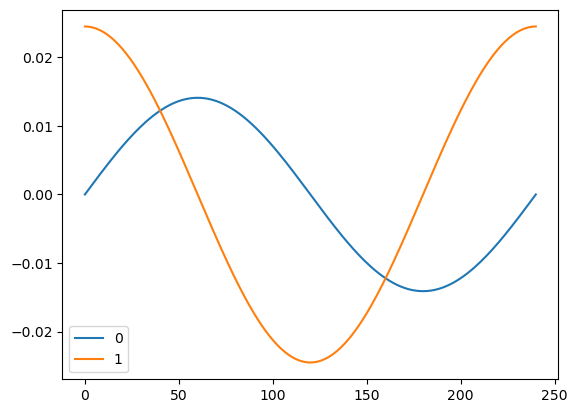

In [15]:
one_df.plot()

# Data processing pipline

In [16]:
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,3.409764


In [17]:
# Filter out columns of non object type
num_cols = pd_train.select_dtypes(exclude=['object']).columns.tolist()[:-1]

print("Non-object columns:", num_cols)

Non-object columns: ['E(Gpa)', 'TS(Mpa)', 'ss（Mpa）', 'm']


In [18]:
num_si_step = ('si', SimpleImputer(strategy='median'))
num_ss_step = ('ss', StandardScaler()) #Normalization of mean standard deviation
num_steps = [num_si_step, num_ss_step]

num_pipe = Pipeline(num_steps)
num_transformers = [('num', num_pipe, num_cols)]

ct = ColumnTransformer(transformers=num_transformers)

x_all = ct.fit_transform(pd_train)
x_all.shape

(914, 4)

In [19]:
x_all[:5]

array([[ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619]])

In [20]:
y_all = pd_train['Nf(label)'].values
y_all.shape,y_all[:10]

((914,),
 array([4.42758347, 4.07125588, 3.81211084, 3.57310378, 3.4097641 ,
        3.0374265 , 4.61187194, 4.30209272, 3.98421217, 3.88109922]))

In [21]:
dim_num = x_all.shape[-1]
dim_num

4

# Divide the dataset and test set

In [22]:
from sklearn.model_selection import train_test_split

# x_all_new, csv_value_array, y_all are 3 NumPy arrays
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test,csv_files_train, csv_files_test = train_test_split(x_all, csv_value_array, y_all,csv_files, test_size=0.2, random_state=42)

print("The size of the training set：", x_train.shape[0])
print("The size of the test set：", x_test.shape[0])
x_train.shape, x_test.shape, csv_value_train.shape, csv_value_test.shape, y_train.shape, y_test.shape

训练集的大小： 731
测试集的大小： 183


((731, 4), (183, 4), (731, 241, 2), (183, 241, 2), (731,), (183,))

# Pytorch dataset dataloader
   
  Prepare Dataset

In [23]:
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test

(array([[-1.40434922, -0.91169623, -0.35126438, -0.20713854],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854],
        ...,
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.87982918,  3.82676089,  3.69451712, -0.20713854],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854]]),
 array([[ 0.8716714 ,  0.47814685,  0.67391102, -0.20713854],
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.6677269 ,  2.3980502 ,  2.73799185, -0.87655194],
        [-1.42066478, -0.78648514, -0.8409687 ,  0.53665412],
        [-0.37646894, -0.67796886, -0.98284566,  0.53665412],
        [-1.41577011, -1.24934879, -0.7379935 ,  1.0325159 ],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.1079

In [24]:
from torch.utils.data import TensorDataset

train_ds = TensorDataset(torch.tensor(x_train).float(),torch.tensor(csv_value_train).float(), torch.tensor(y_train).float().unsqueeze(1))
test_ds = TensorDataset(torch.tensor(x_test).float(),torch.tensor(csv_value_test).float(), torch.tensor(y_test).float().unsqueeze(1))

In [25]:
len(train_ds), len(test_ds)

(731, 183)

# Prepare dataloader

In [26]:
batch_size = 20
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [27]:
train_dl

# Check shape of the input data

In [28]:
for b_x, b_x_csv,b_y in test_dl:
  print(b_x.shape)
  print(b_x_csv.shape)
  print(b_y.shape)
  break

torch.Size([20, 4])
torch.Size([20, 241, 2])
torch.Size([20, 1])


In [29]:
b_y

tensor([[3.8176],
        [4.4358],
        [5.6955],
        [2.8451],
        [5.9240],
        [3.6521],
        [4.6064],
        [3.3818],
        [4.3040],
        [3.1956],
        [4.4381],
        [2.3711],
        [3.0817],
        [3.8833],
        [2.8331],
        [3.8063],
        [3.4143],
        [4.2310],
        [4.9761],
        [3.5997]])

# Prepare for training

In [30]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X,x_csv, y) in enumerate(dataloader):
        X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

        # Compute prediction error
        pred = model(X,x_csv)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 5 == 0:
            loss, current = loss.item(), (batch + 1) * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for (X,x_csv, y) in dataloader:
            X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

            pred = model(X,x_csv)
            test_loss += loss_fn(pred, y).item()
    test_loss /= num_batches
    print(f"Avg loss: {test_loss:>8f} \n")
    return test_loss

In [31]:
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


# Build model
  structural data part

In [32]:
class DNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.lin1 = nn.Linear(dim_num,200)
        self.lin2 = nn.Linear(200,100)
        self.lin3 = nn.Linear(100,100)
        self.out = nn.Linear(10, 1)
        self.flatten = nn.Flatten()

    def forward(self, x):

        x= F.relu(self.lin1(x))
        x= F.relu(self.lin2(x))
        x= F.relu(self.lin3(x))
        # x = self.out(x)

        return x
dnn_block = DNNModel().to(device)

dnn_block(b_x.to(device)).shape

torch.Size([20, 100])

LSTM part

In [33]:
class LSTMModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.lstm = nn.LSTM(2, 5)
        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(1205,100)
        # self.lin2 = nn.Linear(10,1)


    def forward(self, x):
        # x = self.flatten(x)
        x,_= self.lstm(x)
        x = self.flatten(x)
        x= self.lin1(x)

        return x
lstm_block = LSTMModel().to(device)

lstm_block(b_x_csv.to(device)).shape

torch.Size([20, 100])

Merge models

In [34]:
class bigModel(nn.Module):
    def __init__(self, ):
        super().__init__()
        self.strct_block = dnn_block
        self.lstm_block = lstm_block
        #self.f_block = f_block
        #self.cnn_block = cnn_block

        self.flatten = nn.Flatten()
        self.att = nn.TransformerEncoderLayer(100,2)

        self.lin1 = nn.Linear(200, 100)
        self.lin2 = nn.Linear(100, 100)
        self.out = nn.Linear(100, 1)
    def forward(self, b_x, b_x_csv):
        x_strct = self.strct_block(b_x)
        x_lstm = self.lstm_block(b_x_csv)
        #x_f = self.f_block(b_x_csv)
        #x_cnn = self.cnn_block(b_x_csv)
        x = torch.stack((x_strct, x_lstm), dim=1)
        print(x.shape)
        #x = self.att(x)
        x = self.flatten(x)
        print(x.shape)
        x = F.relu(self.lin1(x))
        #x = torch.cat((x, x_f), dim=1)
        #print(x.shape)
        x = F.relu(self.lin2(x))
        x = self.out(x)
        return x

big_model = bigModel().to(device)
big_model(b_x.to(device), b_x_csv.to(device)).shape

torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 1])

Loss function and optimizer

In [35]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.AdamW(big_model.parameters(), lr=1e-3)

Training and testing

In [36]:
# Initialize Best Test Loss
best_test_loss = float('inf')

epochs = 3000
train_loss_list = []
test_loss_list = []

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dl, big_model, loss_fn, optimizer)
    train_loss = test(train_dl, big_model, loss_fn)
    test_loss = test(test_dl, big_model, loss_fn)

    train_loss_list.append(train_loss)
    test_loss_list.append(test_loss)

    # Save Best Model Weights
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        torch.save(big_model.state_dict(), 'best_model_weights_LSTM.pth')
        print(f"Best model saved! loss is {best_test_loss}")

print("Done!")

# Load Best Model Weights
best_model = big_model
best_model.load_state_dict(torch.load('best_model_weights_LSTM.pth'))
best_model.eval()  # Set the model to evaluation mode and disable the impact of Dropout and Batch Normalization


Epoch 1
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 14.133295  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 6.857549  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 1.442255  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.545311  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20,

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.700762  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.509085  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.980900  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.857197  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.426099  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.361255  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.492506  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.384717  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.550545 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.681945 

Epoch 18
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.432487  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.464616  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.638694  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.551878  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.353860  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.639039  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.701016  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.598491  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.476028  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.601324  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.624164  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.819054  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.883547  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.656649  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.761949  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.632623  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.207489  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.962468  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.310885  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.301876  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.457525  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.467931 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.601976 

Epoch 49
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.443832  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.547175  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.610439 

Epoch 51
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.263385  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.394157  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.976281  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torc

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.654496 

Epoch 53
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.338339  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.741578  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.493047  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torc

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.564092 

Epoch 55
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.527485  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.721794  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.569689 

Epoch 57
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.276512  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.522128  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.587649 

Epoch 59
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.470404  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.610125  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.629679  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.315774  [  320/  731]
torch.Size([20, 2, 10

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.634240  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.617269  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.519024  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.538320  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.520801  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.373783  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.559190  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.306265  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.729501  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.410691  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.517619  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.693868  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.256495  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.961908  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.406275  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.324448  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.846479  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.522660  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.537123  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.524922  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.913814  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.586495  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.579267  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.379643  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.506556  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.489464  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.488225  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.579844  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.468450  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.476602  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.316454  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.375577  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.522036  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.470538  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.244993  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.508379  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.396507  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.455019  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.254997  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.283135  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.216376  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.371689  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.422272  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.792398  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.616133  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.359107  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.466325 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.147896  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.415774  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.206969  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.427476  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.451335  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.841757  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.429468  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.245260  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.423014  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.633747  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.510939  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.522897  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.412978  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.345702  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.376246  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.398259  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.395968  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.369476  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.469066  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.461035  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.421741  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.312714  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.421609  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.365104  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.430537  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.355543  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.559140  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.636385  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.778906  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.941542  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.985493  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.984463  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.693347  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.538984  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 1.027055  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.210895  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.352401  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.572472  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.377132  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.524589  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.360551  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.337830  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.694632  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.518782  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.763257  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.755698  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.751012  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.252166  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.459267 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.559137 

Epoch 129
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.219083  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.403916  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.624849  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.309832  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.694918  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.380370  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.493362  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.266437  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.469974  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.529720  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.202859  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.516114  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.344451  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.370698  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.486725  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.511822  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.357031  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.272236  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.393594  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.530224  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.455660  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.451798  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.273164  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.504025  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.652118  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.295708  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.396262  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.434417  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.429284  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.439004  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.426053  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.449444  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.592953  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.670456  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.427754  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.579160  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.240424  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.810594  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.332525  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.485961  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.393793  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.419507  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.482121  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.343507  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.531110  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.595277  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.334128  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.946436  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.378658  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.452004  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.373099  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.391685  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.510859  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.551366  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.507247  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.401398  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.565396  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.421912  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.548034  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.304528  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.594566  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.424786  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.538496  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.354035  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.946028  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.541314  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.521834  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.542407  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.442420  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.620385  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.334929  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.341668  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.146920  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.722562  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.373969  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.318601  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.415194 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.411827 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.477938 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.495470  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.356625  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.364437  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.350315  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.192672  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.459983  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.142645  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.619612  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.267209  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.216251  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.277696  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.387830  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.217320  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.409878  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.447170  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.251155  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.270831  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.426520  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.299605  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.555852  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.374732  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.725662  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.393291  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.538410  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.336977  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.311054  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.435282  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.345081  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.592117  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.228495  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.320950  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.125041  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.421608  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.484634  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.189326  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.224888  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.315073  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.644745  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.227278  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.105288  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.299277  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.311497  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.301242  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.462339  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.448872  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.240236  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.309526  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

Best model saved! loss is 0.3025373563170433
Epoch 209
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.246298  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.202454  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.464901  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094799  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.273104  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.424129  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.392319  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.172394  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.231276  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.232959  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.119173  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.213945  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.160925  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.364156  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.447324  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.409529  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.221936  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.399992  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.607616  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.379387  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.525275  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.391498  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.350987  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.760372  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.150162  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.151142  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.366065  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.332052  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.208665  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104971  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.432231  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.233662  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072105  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.196778  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.384582  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117930  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.188497  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.204067  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.300075  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.408190  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.349474  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.332100  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.343555  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.220252  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.154710  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.284367  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.470588  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.256673  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.304021  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.214581  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.155866  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.225889  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.229257  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.177291  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.189619  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.280511  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.650964  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.305652  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.409746  [

loss: 0.219756  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.210649  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.329882  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.287332  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.158320  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.213865  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.249686  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.125713  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.488066 

Epoch 245
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.345134  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.579373  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.259264  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.257297 

Epoch 247
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.201512  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.269229  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.108919  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.210313  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.191512  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.267152  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.175073  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.186042  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.214671  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.188443  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.153967  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.217059  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.174607  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.245585  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.231333  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.231873  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.243355  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.304804  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.305208  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.477428  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.319368  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.380633  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092401  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.167413  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.561230  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.181147  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.294667  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.257026  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.233736  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.113979  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.297484  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.206305  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.201806  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.112387  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.276215  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.215162  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.215313  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.100716  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.194731  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.122736  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.171537  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.228488  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.456136  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.254129  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.235293  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.198895  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.157563  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.243771  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.245209  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.341265  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.269809  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.292311  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.197807  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.184346  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

Best model saved! loss is 0.23200026005506516
Epoch 275
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.195176  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.112996  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.142802  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.279083  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20,

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.270141 

Epoch 277
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.133994  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.149671  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.153780  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.235394 

Epoch 279
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085730  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.229830  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.245536 

Epoch 281
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.278476  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.137717  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.229762  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.227991 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.256261 

Epoch 283
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.234740  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110371  [  120/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.171439  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.138354  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.131733  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.187296  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.108006  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.214926  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.141158  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.154539  [

loss: 0.168938  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.240204  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.100407  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.123397  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.186020  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.145156  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.205817  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.195589  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.163390  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.256393  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.112954  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.219867  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.195048  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.262775  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.195848  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.267902  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.360961  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.183034  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.192526  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.187003  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.224761  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077629  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.292729  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.146252  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.130261  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.164892  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.146507  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.418827  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.307484  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.146432  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.191797  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.102536  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.202138  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.132416  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.279046  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.131981  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.362522  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.202854  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.162949  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.171831  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.377098  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.111025  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.208849  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.119456  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.224493  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.126200  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.122385  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073685  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.216104  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071145  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.106473  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.127652  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.309587  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.219998  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.185209  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101097  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.170961  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092535  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.141044  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062497  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078869  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066550  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.108300  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.120055  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.141398  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.128727  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.079663  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.079348  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.185388  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080828  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.176616  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.090435  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076825  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070449  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.125034  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.143426  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.103005  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057382  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.116749  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076346  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.330455  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.131258  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.178301  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097924  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080782  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053705  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.106160  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.109709  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.204336  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067357  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.085458 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066257  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060449  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097057  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101688  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.075907  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.107192  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.096694  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.102589  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.142281  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.057391  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.102397  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110371  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071688  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080595  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082300  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.114960  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055772  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.125769  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.108070  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053578  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084849  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097869  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055702  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056895  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063340  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069132  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110486  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069560  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069355  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.126706  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.133044  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045767  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046502  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072177  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093097  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101089  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073413  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054026  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.153813  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.105710  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038557  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031888  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046541  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043700  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076813  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.119826  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.040416  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.100006  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062775  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095306  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072619  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033932  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072212  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050232  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063031  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.159029  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056551  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073538  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085173  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053236  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.108021 

Epoch 388
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081250  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071615  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046569  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066961  [  320/  731]
torch.Size([20, 2, 1

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.102066  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033709  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.114071  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060953  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.102485  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045697  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060725  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063814  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053106  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078279  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065693  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035180  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.118780  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053822  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.129884  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045034  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064986  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094348  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064919  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036762  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093208  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048840  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030913  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095822  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069202  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.125730  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072493  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050729  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.138706  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073808  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.140968  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.133215  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.089360  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039032  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087392  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061881  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084534  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019076  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062770  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055989  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076353  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.118190  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078351  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057105  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.052339  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054850  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049031  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047476  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080182  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056687  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071153  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.113150  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.144831  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058593  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058263  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060169  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054466  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041161  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047324  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057249  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032108  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.124983  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056202  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104738  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064611  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030230  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070781  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063890  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037567  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.127464  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044673  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053623  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028405  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081427  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052679  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057021  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049969  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031594  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.107895  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038608  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082963  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084120  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.115220  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.173699  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.145619  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066596  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087726  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059627  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.080334  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020466  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067182  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039903  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.103590 

Epoch 440
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064222  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060153  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049608  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.110168 

Epoch 442
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078328  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028078  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043480  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.074722 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094535 

Epoch 444
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080089  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080946  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.121789 

Epoch 446
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069820  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068040  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085127  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058826  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041024  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052497  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.108817  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073124  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082375  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073634  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072916  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054562  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093052  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055073  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047372  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.156119  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020278  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062247  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032580  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058538  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069825  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.111178  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044310  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.135247  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040859  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080133  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.108103  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041357  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054341  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060190  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036778  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049950  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086931  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062530  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067993  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037843  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033200  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050001  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058860  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058304  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.083875  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041582  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034072  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051107  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053409  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036237  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.043002  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050482  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058341  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039172  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056002  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031926  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052804  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085370  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.057252  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025751  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062989  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.115770  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.095214 

Epoch 485
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019038  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029092  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069014  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028522  [  320/  731]
torch.Size([20, 2, 1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.098677 

Epoch 487
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077056  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070689  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052313  [  220/  731]
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.103286 

Epoch 489
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035971  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049335  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055034  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.107158 

Epoch 491
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084561  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085084  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036303  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.102001 

Epoch 493
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092178  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028304  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.076326 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.117568 

Epoch 495
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.109419  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036322  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026598  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044706  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088724  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043433  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020315  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062347  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063549  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024159  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076369  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046116  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063615  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061934  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030949  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044028  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.100654  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052191  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046007  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.109382  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101337  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051171  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058753  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.182201  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061199  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.041302  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057664  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104625  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097892  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.060534  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064396  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082697  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031858  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.036679  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060320  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035850  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053495  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048434  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051067  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059606  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072306  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081996  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032598  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067501  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067509  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.106857  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044262  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097795  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049580  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074639  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061483  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074654  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044568  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022147  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058261  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093826  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049506  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049172  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031300  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059982  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084844  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063211  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031636  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015445  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050476  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094260  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056669  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032454  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047709  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048388  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091466  [

loss: 0.049821  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.098194  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041600  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054308  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038686  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073464  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039251  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055302  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080182  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064717  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084053  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085573  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.096033  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052453  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.086971 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.052522 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047013  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037903  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028991  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061317  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071522  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.026939  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104251  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035505  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.024286  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059811  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053844  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051159  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028665  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.022721  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042751  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074614  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031344  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080782  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088701  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029557  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071208  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082941  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036718  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.126073  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048316  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047573  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028736  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020112  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055948  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043245  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058648  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048538  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024524  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055503  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061132  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063406  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035871  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049275  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087522  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038055  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026960  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.040077  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034193  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066951  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.046383 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.093003 

Epoch 609
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047388  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.048750 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.091611 

Epoch 611
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046472  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035020  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.105664 

Epoch 613
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.075165  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039317  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094800 

Epoch 615
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009482  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050977  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065499  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034917  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042435  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043757  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042835  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025480  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068452  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049678  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031558  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053958  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050592  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.063551  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042438  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037852  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.103077  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.051432  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048924  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092490  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035284  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046542  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080355  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020229  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085364  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024851  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041171  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056053  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039450  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041466  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037976  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069997  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059391  [

loss: 0.057583  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055349  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093152  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091514  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027106  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092811  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030769  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028691  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068623  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049539  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029992  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092255  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052463  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023107  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061418  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077807  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025040  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049099  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051772  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057852  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017291  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045985  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040592  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044591  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.061754 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.115292 

Epoch 648
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044017  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063018  [  120/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094638 

Epoch 650
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041691  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061327  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025315  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060986  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069516  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040246  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053369  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047944  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052651  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039085  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060433  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070769  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051684  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070933  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013540  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052261  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084213  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045747  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067091  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053471  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022251  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039066  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073000  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031472  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053773  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030925  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060128  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043904  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.084477  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055700  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071137  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047238  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.059442  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043686  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031194  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070279  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068184  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040193  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037642  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065995  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029349  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035778  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054944  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047700  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060235  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023378  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055586  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055072  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032269  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043326  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056902  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024386  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032699  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076237  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030158  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028172  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043366  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041780  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053993  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046776  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050410  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078616  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016064  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042970  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028444  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043244  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.105040  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.118248  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021417  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049939  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062007  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033365  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076742  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033893  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082343  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040407  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058295  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051454  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047270  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034975  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049151  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059062  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117931  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087720  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049799  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037220  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023467  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088973  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056813  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035618  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039185  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056448  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053971  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.092002  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058186  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069376  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042515  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032719  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.112405  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038934  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049239  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041974  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045267  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040061  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033518  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062649  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011311  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023496  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016502  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027936  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085143  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.121251  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023788  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051164  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061721  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086724  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046331  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055672  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055687  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029997  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066499  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044578  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021834  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056994  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068782  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022277  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056262  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007842  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037954  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046103  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043439  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043772  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030095  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046919  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030368  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062855  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.090392  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032749  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030929  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.098159 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.079199  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047947  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042070  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055862  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066524  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051496  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052217  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040152  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055784  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047546  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024535  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024010  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.100362  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033765  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047429  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043526  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045494  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027297  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045694  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047133  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.018932  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026139  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024412  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042069  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018382  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040423  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059425  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023041  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048379  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023829  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022676  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024673  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027531  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053484  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047430  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

loss: 0.052257  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064506  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026931  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037897  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039811  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026032  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.198964  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037649  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032206  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045634  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029934  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.058655  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024498  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019649  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057453  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039789  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060634  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031302  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052963  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117228  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051725  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062173  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041387  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052352  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073001  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056396  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057575  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047863  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061671  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064535  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019943  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067793  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056903  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064838  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046573  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064654  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057889  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034806  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.063983  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.118509  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063819  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061284  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050089  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064689  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039026  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065777  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028016  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048781  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033730  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053842  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071197  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030129  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051317  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009600  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029969  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038891  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048726  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045121  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037990  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018810  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031232  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025065  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053482  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034962  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041172  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059484  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054114  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027613  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024256  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.027897  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055379  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029268  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.041101  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062203  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036222  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063571  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028058  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041541  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014279  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065057  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071935  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.092527 

Epoch 806
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026221  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058321  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052596  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064173  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014321  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066113  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016693  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024226  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026258  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021063  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082452  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046223  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045104  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017421  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032876  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031538  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030651  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016571  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069453  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047191  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043337  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037781  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026507  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017276  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044706  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030381  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022702  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024614  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041698  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037299  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029259  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055793  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033382  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049349  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043872  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023793  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030720  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.035567  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.097784 

Epoch 831
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027895  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037526  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036627  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026432  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039613  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041324  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062977  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032789  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048325  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024958  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067113  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061178  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057378  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026420  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038770  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026275  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.096537  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017291  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037245  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025182  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024584  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024943  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037530  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013482  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017698  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019306  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.025944  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018827  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029768  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026101  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032534  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034792  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014504  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031121  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028953  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022598  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027898  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.022463  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014383  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028251  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014247  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024413  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040372  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074008  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.200367  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017195  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004955  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085128  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030149  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033405  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029949  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042285  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018333  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027082  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054619  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.022667  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018207  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043929  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025617  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013253  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018143  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027270  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010865  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021897  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038611  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016499  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044747  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.017268 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.015781 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.017176 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.075436 

Epoch 896
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006713  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.016127 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.076097 

Epoch 898
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016759  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014886 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073908 

Epoch 900
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010124  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010827  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012674  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035963  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019111  [

loss: 0.005999  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023229  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018138  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020359  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015844  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036415  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025054  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005798  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010574  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012190  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062652  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016137  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.024087  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017554  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008902  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024276  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026121  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011983  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013531  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020925  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015027  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024513  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013666  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025109  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024676  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040196  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009721  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015104  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040923  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005422  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018892  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028339  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014434  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042369  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018341  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012512  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017654  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044701  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041793  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021810  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032401  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051320  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010698  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020954  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.031071  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008497  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025474  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029537  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012059  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018399  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007792  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011174  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022502  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019852  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012903  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024315  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014337  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016911  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026483  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022847  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025396  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016955  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013691  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021229  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017114  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014128  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018278  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008397  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024682  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028678  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019290  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022730  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031176  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020638  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013390  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006587  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014669  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009136  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026840  [

loss: 0.027032  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010514  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009971  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011631  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009337  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013815  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007770  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019611  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024752  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012618  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018236  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014944  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006863  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028843  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011669  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011391  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021280  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010710  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048305  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018430  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004961  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018875  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019530  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030739  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010005  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004771  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007471  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.009783  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019360  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017240  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006590  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007041  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018245  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022219  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012367  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043833  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088176  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017688  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012749  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008795  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012202  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007454  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010284  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.010454  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007670  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006889  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018079  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022282  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018339  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007437  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009723  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015468  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010372  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012157  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008433  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013421  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.007835  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013879  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012786  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020944  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015484  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011923  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012676  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.017494  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010336  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020214  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008857  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010966  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009950  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010063  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012372  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011516  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014214  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033059  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017220  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017297  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010858  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013572  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015141  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010936  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013688  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013861  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015258  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019925  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018650  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007495  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020356  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007235  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004496  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012625  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009422  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017513  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011619  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010401  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018676  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023911  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007816  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014794  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086718  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011040  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012693  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.006892  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009874  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020292  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006093  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007437  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016840  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007241  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011668  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030977  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014463  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.033102  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021214  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014377 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011133 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013995 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069726 

Epoch 1089
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072466 

Epoch 1091
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013754  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014113  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019448  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033637  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013239  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016476  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010011  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017443  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008536  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012933  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007636  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006094  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016512  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018045  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016343  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014023  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014927  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013135  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007947  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012562  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005882  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017776  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005136  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005471  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015227  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023033  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018960  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005932  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011358  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016152  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013200  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005179  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008439  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007960  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011345  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012042  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012649  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008141  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007593  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018730  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025496  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010306  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011860  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012645  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007166  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036623  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006563  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006958  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015148  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006673  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014614  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010069  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014032  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013781  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008801  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017111  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020581  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012321  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015797  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007732  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033030  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018695  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009815  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011777  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019718  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014301  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009262  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007461  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015701  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015364  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009545  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009565  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009345  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020971  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009293  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010594  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011200  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010316  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007851  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008967  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003851  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013346  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019593  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019846  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008863  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009279  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022592  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006492  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012957  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008948  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006471  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006525  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031288  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006070  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006969  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019192  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020498  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011554  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009451  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008080  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026079  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013583  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021448  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012249  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009451  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.016849  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004299  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010126  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020766  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013173  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012921  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011679  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019515  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008404  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007000  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006119  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011497  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011747  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010279  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.004970  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017357  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010282  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012926  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006017  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006515  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011846  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005209  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008514  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019020  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009816  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006534  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009777  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019492  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008928  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.013778  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006648  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003565  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077907  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017932  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031584  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008624 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010272 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068758 

Epoch 1180
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006277  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009173 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068350 

Epoch 1182
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012799  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008823 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064438 

Epoch 1184
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024251  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012929 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060356 

Epoch 1186
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014521 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011297 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066227 

Epoch 1190
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007605 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013820 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067656 

Epoch 1194
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009991 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063040 

Epoch 1196
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.023764 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012965 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068772 

Epoch 1200
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023360  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026314  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066795 

Epoch 1202
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015056  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007864  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060689 

Epoch 1204
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008831  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003132  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007135  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.015649 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071023 

Epoch 1206
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015071  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016927  [  120/  731]
torch.Size(

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061629 

Epoch 1208
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008547  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022084  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065297 

Epoch 1210
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007385  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016543  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018491  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

loss: 0.005596  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007273  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003817  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014207  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014198  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017265  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012068  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009612  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021900  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005977  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006137  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014093  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009214  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036134  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006320  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007817  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008029  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012789  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029591  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030034  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005452  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007762  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009036  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008448  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006187  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006102  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006472  [

loss: 0.012335  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006040  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011560  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009257  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.001799  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012938  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006534  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003296  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005310  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012372  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010384  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011368  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023446  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016927  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017258  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017838  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.027767  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011430  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018773  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004677  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043231  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022489  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017283  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021489  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007354  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041929  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011499  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005209  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007190  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005199  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007416  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008123  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022300  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007609  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014505  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021581  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008923  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004919  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007644  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004811  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008286  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006290  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012732  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006406  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003699  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015417  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005181  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003093  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011026  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009144  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009620  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007702  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014058  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008583  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009027  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004978  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014635  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010291  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013034  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008061  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008801  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015919  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012494  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035650  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006677  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012849  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.014487  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009698  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016029  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024184  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009368  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009040  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007641  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015826  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008889  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009344  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015971  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007928  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020306  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020615  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014970  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006269  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006849  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012926  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005881  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029387  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007137  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007595  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012586  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006656  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008658  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007357  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010953  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008606  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013486  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008760  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006073  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006164  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012004  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017285  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040891  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015091  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023859  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044503  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006354  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009023  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016169  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015344  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008217  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018429  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012783  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015907  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061127  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041691  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006691  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005737  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012778  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017248  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008021  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007483  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006693  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012635  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002423  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003512  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011824  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003503  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013199  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015442  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019707  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006280  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006390  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007102  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012052  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009976  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013572  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013664  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005401  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021845  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005089  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025126  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012666  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007407  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014996  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011624  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010357  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015522  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012348  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007745  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009336  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005159  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009675  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016646  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009864  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110930  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009046  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024550  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007950  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009301  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012909  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009468  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017259  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019459  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011854  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013071  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032165  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007285  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018073  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012425  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007668  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011210  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009095  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007325  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029934  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004019  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012569  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011237  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005809  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007342  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007761  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006402  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005506  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009650  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013112  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006926  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009436  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009309  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006540  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010606  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020983  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012250  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004392  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006752  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005130  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005114  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008479  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008048  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009008  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004014  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007649  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009963  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006796  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008198  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003139  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004309  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005810  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007775  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006907  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020945  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035062  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010161  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009343  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019562  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013591  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013578  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004242  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005776  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006513  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007626  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006798  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006943  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008805  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008981  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003743  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006228  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007922  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011611 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063648 

Epoch 1345
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011720  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012247 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009377 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007814 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060379 

Epoch 1353
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007232  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003507  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002959  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064462 

Epoch 1355
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006424  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026672  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005903  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061309 

Epoch 1357
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004262  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005259  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006050  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059338 

Epoch 1359
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007161  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006135  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064002 

Epoch 1361
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004805  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004068  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.056410 

Best model saved! loss is 0.05640962962061167
Epoch 1363
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036593  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010764  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

loss: 0.007339  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011303  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006056  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008782  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005862  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016146  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005236  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016058  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009077  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007383  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008525  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009505  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015944  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015531  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.006354  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005589  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003788  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011258  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008883  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003571  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004773  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027957  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011093  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004904  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009187  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004096  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004728  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014807  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013032  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013056  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011050  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007019  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046941  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005032  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007932  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007499  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008478  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006716  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023761  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002993  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011269  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009585  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006416  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010419  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021220  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018185  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006306  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008197  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003689  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015096  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018789  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007012  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004931  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010435  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.164963  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.006394  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004910  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012250  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013863  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008132  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006685  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004962  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006271  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006498  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009744  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005665  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004461  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007018  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008286  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009715  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003196  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008221  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004995  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008390  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011187  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006437  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005485  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003854  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008899  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005752  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011094  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005053  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 200])
loss: 0.005381  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012470  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006773  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007830  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004671  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013370  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021872  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012867  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012626  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007243  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017465  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010372  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008890  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.007740  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008022  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023294  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.015523  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010709  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.008295  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005117  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.027770  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018465  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032128  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.003254  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002029  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003214  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013826  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008041  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005632  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003828  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003081  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027043  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006853 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007621 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010288 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008003 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061553 

Epoch 1489
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004342  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007150 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059712 

Epoch 1491
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003348  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004764  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007290  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013590  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007227  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016925  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009166  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015752  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006948  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035080  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006815  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003925  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005886  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004848  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006838  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006583  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005875  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002497  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006305  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006381  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016733  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008612  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007222 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061522 

Epoch 1508
---------

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005586 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063204 

Epoch 1510
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002233  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010522  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008912 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062185 

Epoch 1512
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014933  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009145 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063953 

Epoch 1514
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006871  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004537  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011416 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064860 

Epoch 1516
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014841  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

Avg loss: 0.008562 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058367 

Epoch 1518
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003484  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004176  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062687 

Epoch 1520
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004747  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002813  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016208  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073706 

Epoch 1522
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023163  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017939  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016907  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066174 

Epoch 1524
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009178  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013148  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013358  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065689 

Epoch 1526
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032329  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021511  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011754  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009278  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005192  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007692  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006466  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009712  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023094  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005512  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002850  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001899  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004825  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004265  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008281  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012899  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006873  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005000  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011257  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007403  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005296  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009696  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009211  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014970  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005368  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012933  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012408  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010103  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009137  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006649  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012217  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002230  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003218  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066959  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007376  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006447  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022056  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008158  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006213  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002696  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011782  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005306  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007996  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055427  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005762  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004004  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007536  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005914  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004590  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010696  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005455  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004491  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015748  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016186  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010998  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021328  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007698  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008436  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008733  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004231  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003892  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008829  [

loss: 0.003295  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012438  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004280  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003054  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007593  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001444  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009548  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005648  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.006330  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002211  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004952  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005773  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011457  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019413  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004362  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012425  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014458  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017244  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014863  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009303  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007667  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008027  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003168  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010746  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006226  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007325  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011903  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007610  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012342  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003866  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009370  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004912  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010387  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008932  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009649  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014960  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006168  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006684  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008960  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003757  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006415  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015548  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009870  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003838  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002453  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001800  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007768  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007928  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001184  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018585  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.008122  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013414  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004246  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005179  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007666  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006782 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006957 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065078 

Epoch 1605
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005867  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008257 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062120 

Epoch 1607
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004358  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007150  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070588 

Epoch 1609
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004649  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005624  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010405  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062887 

Epoch 1611
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007858  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007907  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068770 

Epoch 1613
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008334  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008450  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028054  [  220/  731]
to

Avg loss: 0.074379 

Epoch 1615
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006462  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012557  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001383  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008015  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061733 

Epoch 1617
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009939  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006629  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006269  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015264  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005612  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013095  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004848  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011395  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011627  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010382  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.003705  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011008  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003155  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008222 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009935 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006926 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067111 

Epoch 1642
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016393  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063839 

Epoch 1644
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002127  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004925  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005201  [  220/  731]
to

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065377 

Epoch 1646
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003139  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004783  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003336  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008603  [  320/  731]
torch.Size([20, 2, 

Avg loss: 0.064387 

Epoch 1648
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003436  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005035  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003837  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009934  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064878 

Epoch 1650
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004909  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006471  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004427  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002402  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003444  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003639  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002292  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004723  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005357  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006787  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012092  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007075  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007127  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007764  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017493  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006263  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011527  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011434  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007774  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002799  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002434  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026067  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011516  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005244  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005563  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007256  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009596  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010424  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005388  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010333  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010808  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006541  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006389  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010664  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.010133  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004664  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013904  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005372  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010606 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004322  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009594  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006933  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001981  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006859  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006080  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006647  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009105  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002517  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011321  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003885  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003433  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005670  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013613  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034353  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008679  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004358  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005129  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018124  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004689  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004995  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009987  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006216  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.010072  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006142  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005440  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003898  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004735  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007631  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002188  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005047  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009060  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014078  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006466  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011392  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019769  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066954  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007286  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003466  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006685  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003222  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.003406  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009130  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010219  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004885  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009300  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002543  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005911  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007051  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003448  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004224  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007146  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005173  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005609  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003254  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011327  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008013  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007407  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023081  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006505  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008970  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003529  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005063  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007814  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004184  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002522  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003945  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008358 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004571  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008844  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004188  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005672  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012277  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022653  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006918  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003839  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005176  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004589  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005097  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010095  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005044  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003528  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012077  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003330  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025616  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010523  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.002259  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005327  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006164  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006600  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002473  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004633  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013009  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004345  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008924  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003803  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006305  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003603  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007725  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009283  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011259  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006103  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004769  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001861  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004081  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009946  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.006630  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006797  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008172  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011209  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003177  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006126  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006202  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008745  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006130  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008647  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005332  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006603  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002067  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004679  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.016259  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003277  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008577  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016866  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008384  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009171  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008724  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004974  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028279  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009620  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033926  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008799  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.010179  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019942  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004015  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005042  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015247  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007188  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009440  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063703 

Epoch 1785
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017319  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008133  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005412  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005715  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011523  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005959  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006935  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017303  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004035  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018397  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004161  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013699  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.005328  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006836 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012611  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011900  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010173  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014277  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008419  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013840  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010252  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005363  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007566  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062775 

Epoch 1807
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026116  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008585  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008050  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003724  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003126  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007795  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013751  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008879  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011914  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012791  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007686  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008901 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025490  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007948  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005969  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003253  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003093  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003834  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004999  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007510  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004994  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011184  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064622 

Epoch 1827
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005271  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008913  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005513  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009853  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027273  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007653  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004499  [

loss: 0.006705  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005002  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004638  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009008 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066224 

Epoch 1836
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012659  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009803  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006084  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005164  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005358  [

loss: 0.004991  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006055  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006676  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007308  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.005283  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006646 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063220 

Epoch 1845
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003223  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004883  [  120/  731]
torch.Size(

loss: 0.003799  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022042  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003618  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007168  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003677  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002880  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002180  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002518  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006491  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010412  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008135 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063873 

Epoch 1856
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009425  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008071  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004897  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005522  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006645  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003623  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031985  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013043  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006547  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008029 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069403 

Epoch 1865
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010852  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006360  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006741  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022895  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011790  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024078  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014911  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009848  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010740  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007377  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006983  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006309 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.006410  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005285  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005297  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003420  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.015444  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006453  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001979  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006221  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006892 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011022  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006605  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013986  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008984  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.015224  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010390  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014250  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011041  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003714  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029119  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009854 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025935  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005033  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007850  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004016  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009357  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008355  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007503  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005867  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004364  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006677 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059672 

Epoch 1905
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002228  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003617  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002550  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009319  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003743  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002591  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003882  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012834  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005948  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006416  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006106  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019871  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021111  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006264  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006829  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003748  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004048  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017769  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003943  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011477  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003276  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005180  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006604  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005042  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004214  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009194  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004870  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002983  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005554  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011496 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.004572  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021402  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003840  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007014  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005081  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010310  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005213  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007202  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007147  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004644  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011511  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004975  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008425  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010729  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009981  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005381 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060129 

Epoch 1943
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023189  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010016  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004226  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005257  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004825  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003724  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008525  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006851  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003396  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007841  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006818 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025328  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005718  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007957  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011751  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007678  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008547  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008727  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011825  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007730  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005085  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007106 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003867  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014520  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002576  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004044  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008280  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009065  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004438  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005298  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012381  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003025  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003349  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003353  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046373  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006892  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014488  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009544  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005896  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023739  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.022126  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005220  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008119  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004763 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

Avg loss: 0.063394 

Epoch 1983
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003697  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002734  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006861  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012351  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002718  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003243  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004722  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009936  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008317  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006446  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006519 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060539 

Epoch 1992
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003998  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008177  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005575  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011931  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006603  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006540  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007371  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003347  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006794  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004472  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.026427  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013171  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005612 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061424 

Epoch 2003
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006604  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020803  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002485  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003060  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003428  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012793  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006373  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011281  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007301 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067969 

Epoch 2012
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005337  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005428  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008925  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012049  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022747  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026978  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019525  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077859  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008189  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068114 

Epoch 2021
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060526  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007877  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074628  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019296  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014173  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006795  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013374  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006850  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021322  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004950  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005763  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002280  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009542  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002300  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004806  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004237  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004424  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003181  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013379  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006752 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064269 

Epoch 2041
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005118  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016929  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002774  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002856  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004969  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003587  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014459  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003287  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006839  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003046  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002665  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005377  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015085  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005774 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061186 

Epoch 2052
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017683  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 200])
loss: 0.002216  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004069  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004045  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001826  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020396  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009574  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007303  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005589 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063526 

Epoch 2061
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008328  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008871  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015415  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007663  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003078  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001871  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020213  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005515  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011585  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016547  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005124  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005365 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007043  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013513  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004939  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006267  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004306  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004641  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003331  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003644  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.014910  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006985  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021682  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004373  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007860 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063488 

Epoch 2081
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013772  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

loss: 0.012938  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008883  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011881  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023367  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002649  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017615  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036919  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.019586 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069822 

Epoch 2090
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008795  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006274  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011026  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004796  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005158  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020976  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015740  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002726  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064646 

Epoch 2099
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002486  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003326  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004210  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004225  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005813  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013648  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006443  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001628  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001608  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011937  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008613  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004625  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009135  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025212  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007974 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060143 

Epoch 2110
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015202  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060482 

Epoch 2112
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007058  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009346  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006414  [  220/  731]
to

loss: 0.003494  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005817  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006032  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005975  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005991  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015990  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009391  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007280 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059694 

Epoch 2121
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007739  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005576  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002476  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029306  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006549  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018968  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006333  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019255  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004182  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004167  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007389  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004422  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009297  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007021  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004243  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006478  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011285  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005489  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013393  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009860  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

Avg loss: 0.005926 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063843 

Epoch 2138
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008704  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003930  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005739  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002270  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010467  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013056  [  520/  731]
torch.Size([

loss: 0.008361  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021362  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005833  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008386  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004544  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007298 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004846  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002569  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015409  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007977  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002857  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002512  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003247  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006833  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003169  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001935  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.010229  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011970  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012685  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004835  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004682  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013017  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005165  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006711  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007290  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006274  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007149 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058210 

Epoch 2167
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003885  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002870  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008333  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005270  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015133  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008587  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006639  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005353  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005592  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007720 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061019 

Epoch 2174
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008894  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004103  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013402  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008708  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002475  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011777  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006991 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058803 

Epoch 2181
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011149  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004051  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019276  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004756  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008951  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006934  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010750  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006246  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002490  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009295  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007552  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003503  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006428  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004436  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011719  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002128  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006593  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007365  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007565  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007130 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061794 

Epoch 2201
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014606  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006828  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004960  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003518  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005982  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001436  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014884  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005599  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008488  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012793  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003511  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007780  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003179  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007035  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008366  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.015275 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065970 

Epoch 2214
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011017  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062079 

Epoch 2216
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013739  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006682  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011637  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008589  [  320/  731]
torch.Size([20, 2, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007234  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003735  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002431  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006988  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009782  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007510  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004056  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009098  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004168  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004580 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060600 

Epoch 2227
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002586  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003410  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004656  [  220/  731]
to

loss: 0.008084  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002586  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005241  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008214  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002812  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002445  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002804  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008828  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010430  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017655  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059273 

Epoch 2238
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003642  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009586  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003563  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004509  [  320/  731]
torch.Size([20, 2, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009174  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012206  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005273  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004265  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004646  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006908  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062427 

Epoch 2247
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004384  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002945  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008835  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003038  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003734  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006210  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007406  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003891  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018775  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064001 

Epoch 2256
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009993  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002423  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007478  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012694  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003893  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002765  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.010120  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003152  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001915  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003099  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009752  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004475 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058208 

Epoch 2267
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005436  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009738  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007863  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006069  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009147  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007633  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031499  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001896  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004312  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006984 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005654  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007599  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001921  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002347  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003844  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054695  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007482  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002641  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009367  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006464  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059403 

Epoch 2287
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005212  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002872  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008353  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004019  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003076  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025988  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007608  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008241  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008385  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063893 

Epoch 2296
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011516  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009305  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004106  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004649  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005999  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007534  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003484  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028702  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013239  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008984  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004563  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008636 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061569 

Epoch 2305
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004074  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003002  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021442  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004332  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026629  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004129  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005792  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064734  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005715  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010079  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001996  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061113 

Epoch 2316
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003113  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004284  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

loss: 0.003159  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003334  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008373  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004516  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006623  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007027  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003769  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006670 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065166 

Epoch 2325
---------

loss: 0.008999  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012752  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005096  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008071  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017617  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003205  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011610  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012339  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005462  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015441  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023223  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062311 

Epoch 2336
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002327  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006121  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006874  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003180  [  320/  731]
torch.Size([20, 2, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004004  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014749  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006382  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016410  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007667  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003187  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010184  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011631  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013621  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006557  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008964  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010355  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009118  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005250  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006413  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005100 

torch.Size([20, 2, 100])
torch.Size([20

loss: 0.004609  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002920  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003822  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018156  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007479  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001975  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008150  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005170  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003244  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006740  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003671  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006380 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004547  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003082  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013825  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005016  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004417  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001776  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003827  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.004311  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007010 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064933 

Epoch 2372
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005865  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009129  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009031  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015963  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024644  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003512  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007321  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003035  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017970  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025149  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067761 

Epoch 2383
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008042  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004142  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006612  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003449  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001399  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002692  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008390  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006137  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004148  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.025813  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.024971 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006848  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013968  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005302  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009281  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022903  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006984  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008398  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003679  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002157  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005736  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005302  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002974  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002280  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003377  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004568  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003613  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003531  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003616  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002138  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003083  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003817  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003216  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003853 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062808 

Epoch 2414
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004334  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004862  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004629  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004475  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002380  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008308  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004997  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006693  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002768  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005320  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

Avg loss: 0.007311 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061931 

Epoch 2425
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002497  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003180  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003275  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006949  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008526  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.009667  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003091  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004256  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005065 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008225 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059955 

Epoch 2436
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004124  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004084  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003286  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006129  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006328  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007171  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015256  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012142  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004030  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003365  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003913  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002687  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.003073  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062088 

Epoch 2447
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001006  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006516  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001752  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006397  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005810  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001765  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003917  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006538  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004140  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.006246  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006925 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002134  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002613  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003770  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005240  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007898  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005179  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009741  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.035541  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008328  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006349 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065497 

Epoch 2465
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008505  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

loss: 0.002237  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003790  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008076  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006569  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001893  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011357  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003808  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008226  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002307  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005419  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064292 

Epoch 2476
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003430  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012870  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005267  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018605  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006050  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006591  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012051  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004042  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002841  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006693 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015025  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008805  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008582  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008112  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004230  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004086  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029543  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002094  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003594  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002724  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003492  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061593  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004497  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014401  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001469  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005400  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002585  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003647  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004899  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019252  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.006342  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005146 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004509  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000780  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005168  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004566  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007640  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004222  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003762  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.009734  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062954 

Epoch 2514
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002374  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005079  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004393  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007992  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019209  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009360  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005159  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006845  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005753  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007760  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.024221  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063477 

Epoch 2523
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004611  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003406  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002162  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012954  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011585  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021317  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004596  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003077  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003990  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007103 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063172 

Epoch 2532
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002039  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003119  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002906  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004956  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004303  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004709  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006888  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003937  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003349  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005368 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061666 

Epoch 2541
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001830  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004274  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004880  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018870  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001553  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003899  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004744  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028606  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007788  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005619 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005197  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004305  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005498  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013257  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014574  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005125  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006309  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012020  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002379  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006555  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007905 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002885  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005456  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003848  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006668  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017491  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011875  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029206  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028871  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009028  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005997  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064792 

Epoch 2570
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016898  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010606  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006332  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006601  [  320/  731]
torch.Size([20, 2, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005038  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005739  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012801  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019209  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012115  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007594 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016038  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005763  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002613  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003171  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002387  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004256  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003730  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005456  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005575  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002249  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064027 

Epoch 2588
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003163  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004549  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002494  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004848  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002025  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010926  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009731  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008065  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003800  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004742  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008028  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011505 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021614  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005881  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011807  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057862  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022929  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012583  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007936  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003410  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008862  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004589  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005178 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003561  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002882  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005732  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003044  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002669  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003293  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008449  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004860  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 200])
Avg loss: 0.065077 

Epoch 2617
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004313  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002800  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004044  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010809  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011666  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008515  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004150  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004277  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002280  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067174 

Epoch 2626
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004747  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007096  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001768  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006078  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005150  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016687  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014956  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013220  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013676  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005515  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007079  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003724  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005749 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067976 

Epoch 2637
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006290  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004611  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017443  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012055  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002746  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007074  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006073  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002514  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005452  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005963 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066605 

Epoch 2646
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006240  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005216  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014586  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003124  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002255  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002612  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005646  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001776  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001817  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004663  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006926  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022798  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002550  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004027  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009379  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.225731  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006346  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006303  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016720  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004703  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035633  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008041  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006492  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005642 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068607 

Epoch 2666
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046432  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008609  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007940  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032421  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005878  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007014  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018472  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005934  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006612  [  720/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004821  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072333 

Epoch 2677
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012374  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022413  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006101  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014696  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002335  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008731  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006007  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007404  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002320  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003551  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010812 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.076224 

Epoch 2686
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006146  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002747  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004245  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005864  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003208  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004361  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005356  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011971  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.003147  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002824  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063759 

Epoch 2697
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001503  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005484  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

loss: 0.005684  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003045  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011738  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004231  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003139  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003153  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064971 

Epoch 2706
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001436  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001564  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005285  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042138  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007822  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018821  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021255  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009283  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007062  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004187  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004696  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005523  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004754 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001805  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003705  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021154  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002567  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002670  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006029  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002106  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005454  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005651  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007494  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004794 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064520 

Epoch 2726
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001784  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005850  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010296  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009784  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005696  [

loss: 0.009142  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003165  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006332  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011508  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003814 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064133 

Epoch 2735
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004560  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000722  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006070  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021471  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004400  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029362  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005304  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004157  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028646  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008010  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002522  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001513  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067093 

Epoch 2746
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003461  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002529  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005042  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004402  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006821  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009479  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006899  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003568  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002065  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005895  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004734 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005072 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067483 

Epoch 2757
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002134  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004421  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005742  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004662  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004672  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002972  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002988  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005160  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067296 

Epoch 2766
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004184  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004468  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002807  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004086  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003139  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003430  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007706  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004110  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003223  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002906  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004331  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006176  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007371  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064928 

Epoch 2777
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004204  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034969  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006014  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008363  [  320/  731]
torch.Size([20, 2, 

loss: 0.010317  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013080  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015744  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031384  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014181  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022862  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017031  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.009760  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060022 

Epoch 2788
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006994  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006541  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004140  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001504  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004657  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005167  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003852  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004793  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002531  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005005  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004150  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003703 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004220  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001155  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001313  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003169  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002868  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005981  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007586  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006951  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002821  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004375 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061550 

Epoch 2806
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002934  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004587  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006715  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004341  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003656  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006565  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003848  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004119  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007771  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003605  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008008 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062368 

Epoch 2817
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002646  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006315  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044195  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020520  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010982  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002229  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004174  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012842  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004705  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003080  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003429  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003045  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006173 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063271 

Epoch 2828
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002906  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004381  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002468  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006107  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003775  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004975  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005591  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009778  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005339  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001583  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002886  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002313  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008891 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008152  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004352  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004956  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002828  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004861  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004487  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002139  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010602  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004247  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061877 

Epoch 2850
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004288  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005204  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001872  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

loss: 0.004143  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003844  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008688  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012359  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016334  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010164  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007172  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065778 

Epoch 2859
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003588  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005000  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003993  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002664  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004847  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006144  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001113  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003208  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003367  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015311  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006047  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004137  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004444 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005992 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062984 

Epoch 2874
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002776  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002756  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009174  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011556  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002353  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002875  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002127  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003462  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003453  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003665  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002500  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015025  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003747  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.004184  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002961  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004196 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063445 

Epoch 2887
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009226  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005474  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002484  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005321  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004518  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004492  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002889  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004286  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006366  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002292  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002418  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007659  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003157  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006041 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006689  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001178  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005071  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002956  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003682  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003030  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005615  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003165  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006824  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009110  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005972  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007194 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009624  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005494  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005235  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002045  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007078  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001964  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013334  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009440  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006058  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005943  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004855  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006354 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017362  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004970  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012940  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002739  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001678  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001062  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001887  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001750  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017996  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008947  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004744 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061982 

Epoch 2931
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003202  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004984  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013154  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007413  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007777  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009589  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006282  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004748  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064759 

Epoch 2940
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002214  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010383  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006034  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017763  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006554  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003375  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004572  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002111  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016783  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002068  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009469  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007006 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.002727  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003432  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046953  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004124  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007232  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002544  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002280  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003186  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010182 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064415 

Epoch 2958
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012623  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007484  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019007  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008140  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004837  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003017  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003042  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003230  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019557  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009063  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007779 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068820 

Epoch 2967
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002824  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001693  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003067  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005266  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002790  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006790  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005220  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007530  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003771  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006410 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002759  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004117  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005259  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003048  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002600  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011446  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005233  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004671  [

loss: 0.002170  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003672  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004716  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062962 

Epoch 2987
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005779  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010559  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003352  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

loss: 0.009572  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002191  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008453  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002429  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002662  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010023  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005453  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003926  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

loss: 0.005724  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003971  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007928  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006455 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062835 

Epoch 2998
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004403  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001594  [  120/  731]
torch.Size(

loss: 0.007872  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003517  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006271  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003171  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

bigModel(
  (strct_block): DNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (lin1): Linear(in_features=4, out_features=200, bias=True)
    (lin2): Linear(in_features=200, out_features=100, bias=True)
    (lin3): Linear(in_features=100, out_features=100, bias=True)
    (out): Linear(in_features=10, out_features=1, bias=True)
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
  (lstm_block): LSTMModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (lstm): LSTM(2, 5)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (lin1): Linear(in_features=1205, out_features=100, bias=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (att): TransformerEncoderLayer(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=100, out_features=100, bias=True)
    )
    (linear1): Linear(in_features=100, out_features=2048, bias=True)
    (dropout): Dropou

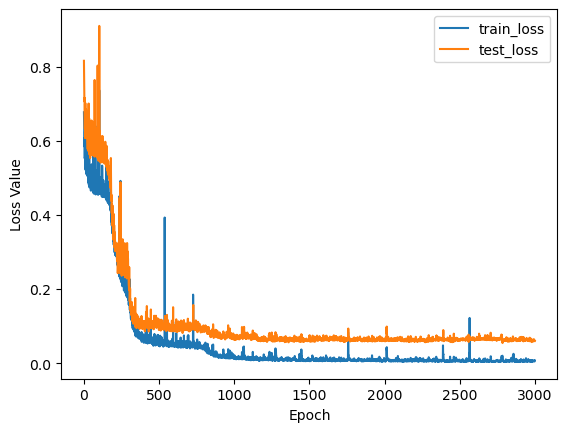

In [37]:
plt.plot(train_loss_list, label='train_loss')
plt.plot(test_loss_list, label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')
plt.savefig("lossvalue",dpi=1200)
plt.show()


In [42]:
predict_list = []
label_list = []
#Change the "test_dl" to "train_dl" to see the result of the training set
for (X,x_csv, y) in test_dl:
    X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

    predict_score = big_model(X,x_csv)

    # predict_score = best_model(x)
    predict_list.append(predict_score.flatten().detach().cpu().numpy().flatten())
    label_list.append(y.flatten().detach().cpu().numpy())

predict_array = np.hstack(predict_list)
label_array = np.hstack(label_list)
#predict_array[:5],label_array[:5]

data_to_write2 = np.column_stack((predict_array, label_array))

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])


In [43]:
r2_score(label_array, predict_array)

0.9118632446922018

In [44]:
mean_absolute_error(label_array, predict_array)

0.1462628

In [45]:
mean_squared_error(label_array, predict_array)

0.059000105

In [53]:
import csv
data_to_write2 = np.column_stack((predict_array, label_array))
csv_filename = "predictions_and_labels_train-LSTM.csv"
with open(csv_filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
   
    # Write title line
    writer.writerow(['Prediction', 'Label'])
    
    # Write data to CSV file
    for row in data_to_write2:
        writer.writerow(row)